## Setting Up the Environment

In this section, we'll install and import all necessary libraries for working with spatial transcriptomics data and applying dimensionality reduction techniques.


In [2]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import squidpy as sq
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import backend as K
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
 
# Dimensionality reduction libraries
from sklearn.manifold import TSNE
import umap
import trimap
import pacmap
 
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)
 
# Plotting settings
plt.rcParams['figure.figsize'] = (12, 10)
sc.settings.verbosity = 3

c:\Users\jacek\AppData\Local\Programs\Python\Python311\Lib\site-packages\dask\dataframe\__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
c:\Users\jacek\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
c:\Users\jacek\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Loading Spatial Transcriptomics Data

Spatial transcriptomics data typically consists of:

1. A gene expression matrix (spots × genes)  
2. Spatial coordinates (współrzędnych przestrzennych) for each spot or cell  
3. Histology images of the tissue section  (obrazów histologicznych przekroju tkanki)
4. Annotations (when available) (adnotacji)

For this laboratory, we’ll work with two different datasets:

- Human brain dorsolateral prefrontal cortex (Ludzka kora przedczołowa grzbietowo-boczna) (DLPFC) from Visium  
- Breast cancer spatial transcriptomics data

Let’s first load the DLPFC dataset:


Dataset shape: (2688, 18078)
Number of spots: 2688
Number of genes: 18078
Available annotations: ['in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster']


C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\3523392187.py:12: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", size=1.5)


<Figure size 1000x1000 with 0 Axes>

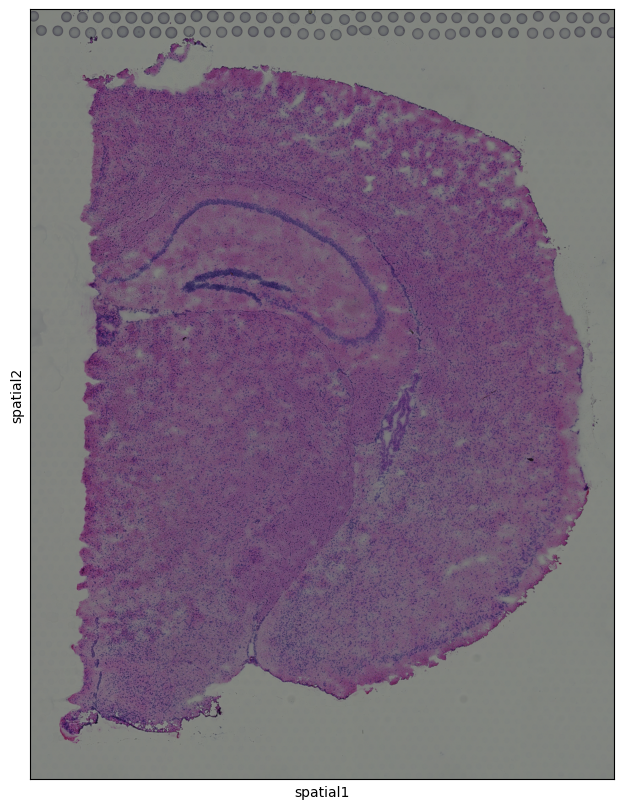

In [3]:
# Load the DLPFC dataset through squidpy's dataset functionality - a section of the human prefrontal cortex - fragment ludzkiej kory przedczołowej
adata = sq.datasets.visium_hne_adata() #scanpy.plotting.spatial - for spatial data visualization - hires (high resolution) - size=1.5 - spot size
 
# Basic data exploration
print(f"Dataset shape: {adata.shape}")
print(f"Number of spots: {adata.n_obs}")
print(f"Number of genes: {adata.n_vars}")
print(f"Available annotations: {list(adata.obs.columns)}")
 
# View tissue image with spots overlaid
plt.figure(figsize=(10, 10))
sc.pl.spatial(adata, img_key="hires", size=1.5)
 
# If annotation is available, visualize with layer annotation
if 'layer_guess' in adata.obs.columns:
    plt.figure(figsize=(10, 10))
    sc.pl.spatial(adata, color='layer_guess', size=1.5)

Now, let’s explore the basic structure of the data:

In [4]:
# Display the first few entries of the gene expression matrix
print("Gene expression matrix (first 5 spots, first 5 genes):")
print(adata.X[0:5, 0:5].toarray())
 
# Display spatial coordinates
print("\nSpatial coordinates (first 5 spots):")
print(adata.obsm['spatial'][0:5])
 
# Check available layers in the AnnData object
print("\nAvailable layers:", list(adata.layers.keys()))
 
# Check available metadata
print("\nSpot metadata:")
print(adata.obs.head())
 
# Check gene metadata
print("\nGene metadata:")
print(adata.var.head())

Gene expression matrix (first 5 spots, first 5 genes):
[[0.         0.         0.87893134 0.87893134 1.3393729 ]
 [0.         0.         1.0922161  1.0922161  1.0922161 ]
 [0.         0.         0.         0.         0.9803591 ]
 [0.         0.         0.         0.         0.        ]
 [0.         0.         0.99697125 0.         0.6179012 ]]

Spatial coordinates (first 5 spots):
[[8230 7237]
 [4170 1611]
 [2519 8315]
 [7679 2927]
 [3138 6280]]

Available layers: []

Spot metadata:
                    in_tissue  array_row  array_col  n_genes_by_counts  \
AAACAAGTATCTCCCA-1          1         50        102               4928   
AAACAATCTACTAGCA-1          1          3         43               3448   
AAACACCAATAACTGC-1          1         59         19               6022   
AAACAGAGCGACTCCT-1          1         14         94               4311   
AAACCGGGTAGGTACC-1          1         42         28               5787   

                    log1p_n_genes_by_counts  total_counts  log1p_to

### Data Preprocessing for Spatial Transcriptomics

*Spatial transcriptomics data requires specific preprocessing steps:*


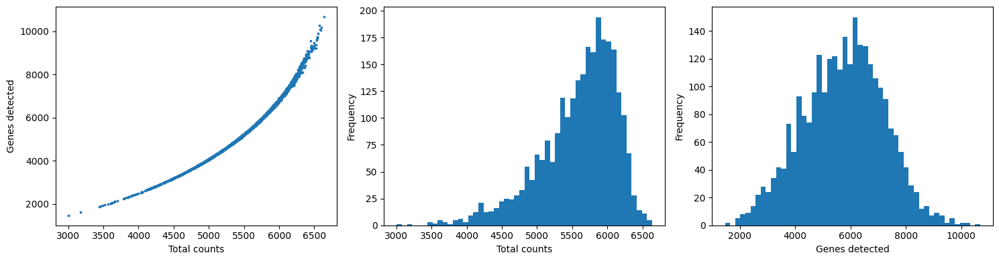

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Number of highly variable genes: 2000


<Figure size 800x600 with 0 Axes>

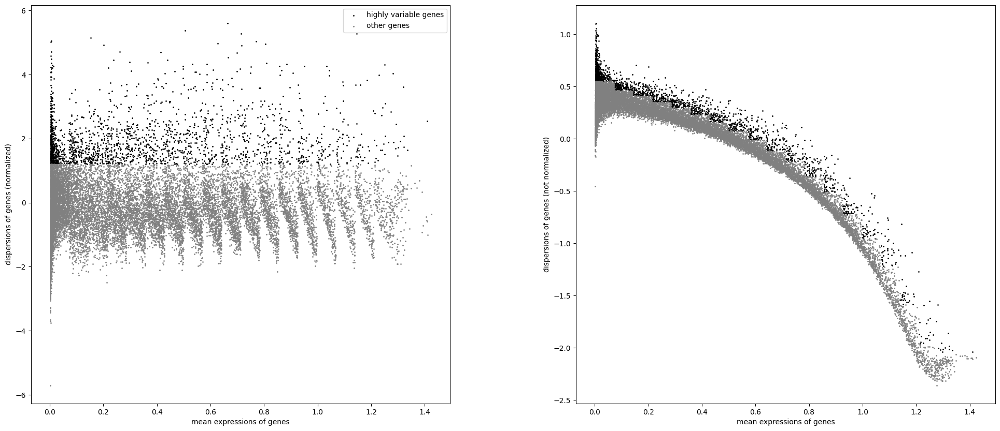

Filtered data shape: (2688, 2000)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50


c:\Users\jacek\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_scale.py:317: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)


<Figure size 1000x800 with 0 Axes>

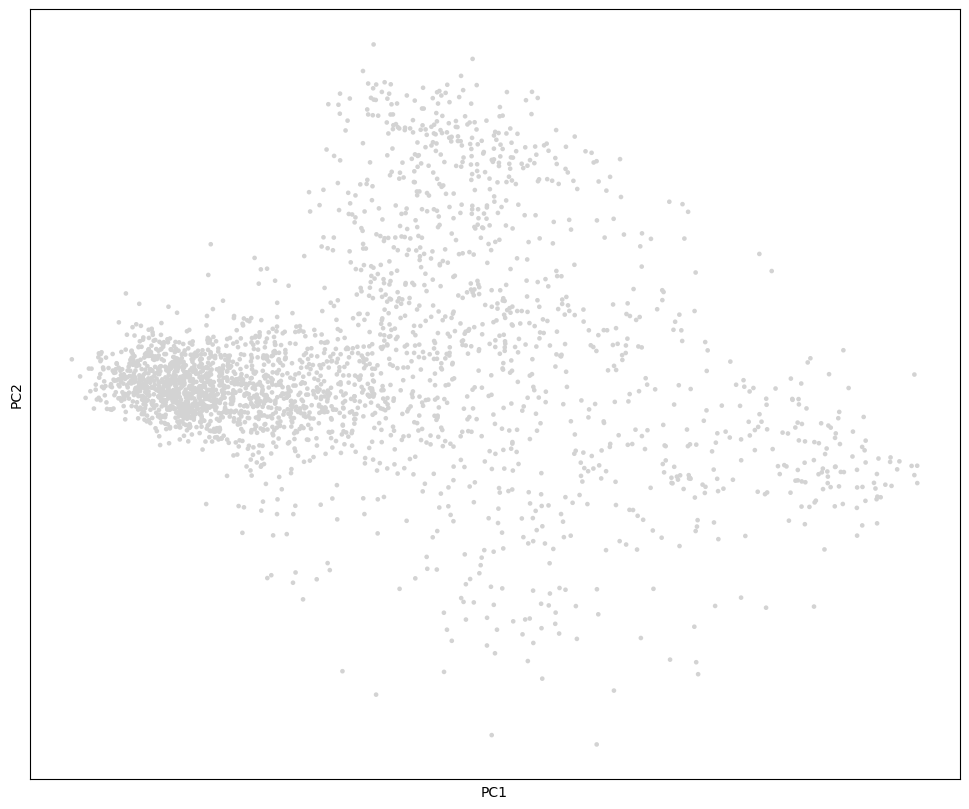

computing neighbors
    using 'X_pca' with n_pcs = 30
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:01)
computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:04)


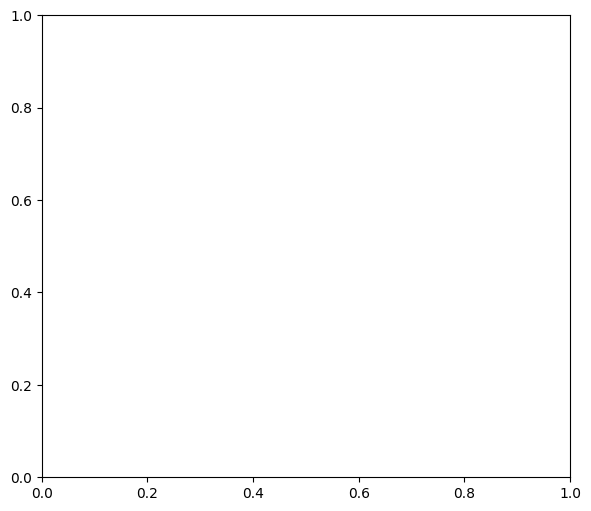

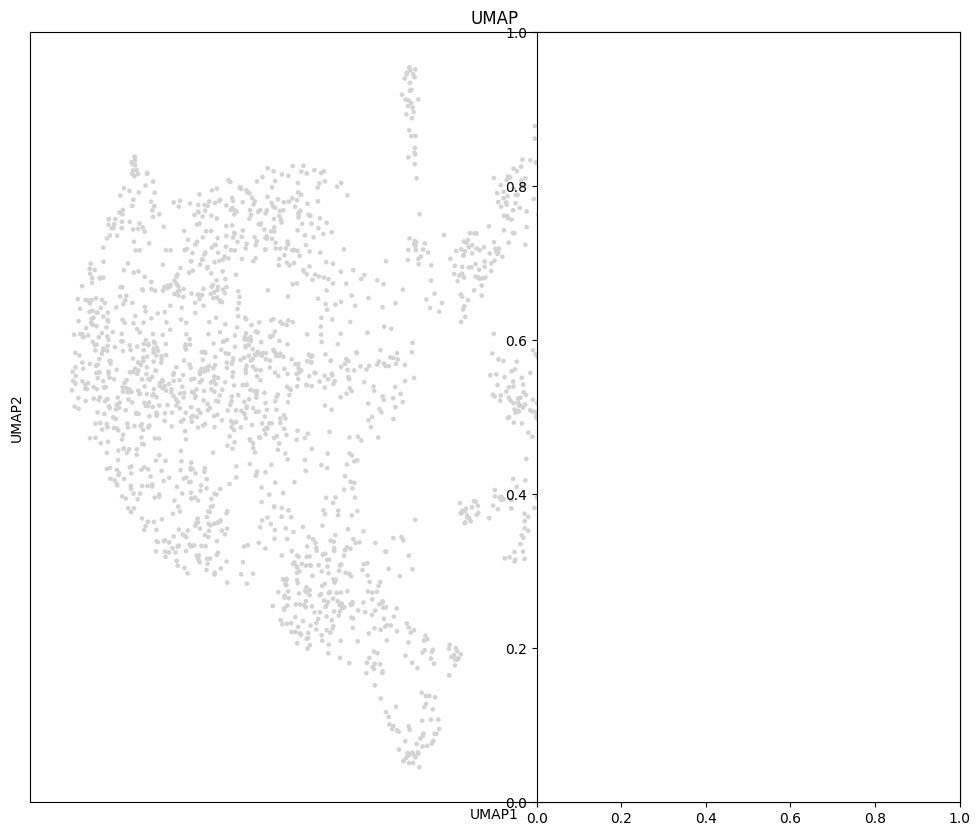

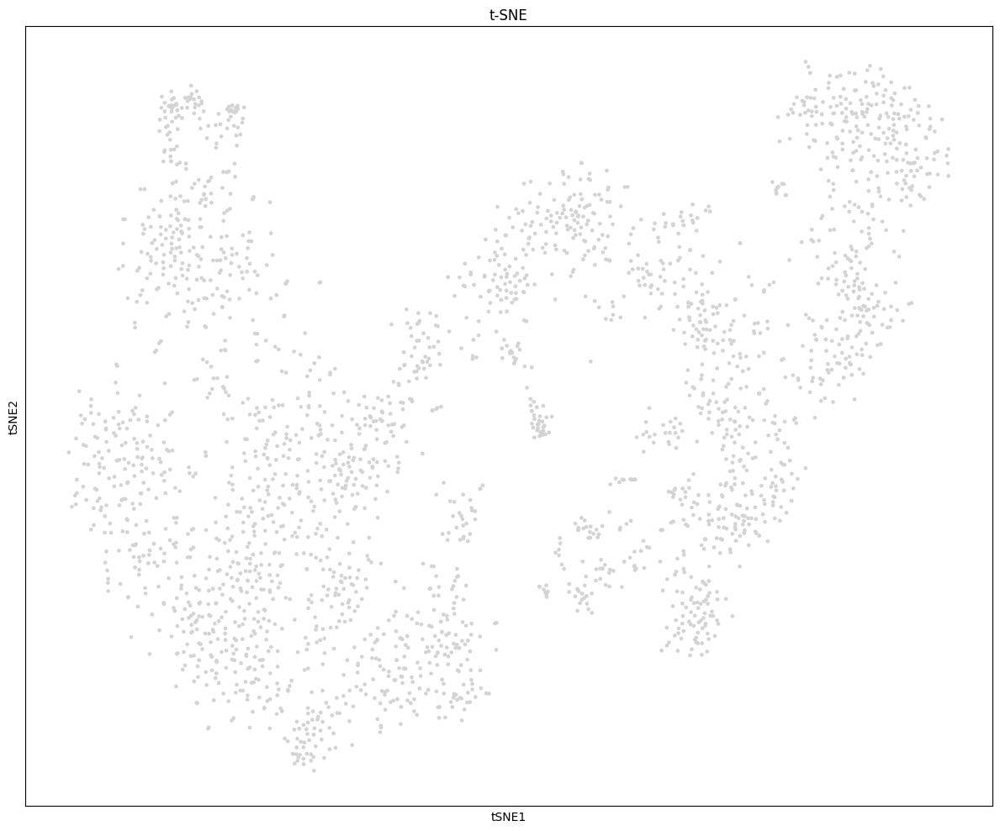

running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
Number of clusters: 18


C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\899094269.py:81: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_hvg)


In [7]:
# Quality control
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)
 
# Visualize QC metrics
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.scatter(adata.obs.total_counts, adata.obs.n_genes_by_counts, s=3)
plt.xlabel('Total counts')
plt.ylabel('Genes detected')
plt.subplot(1, 3, 2)
plt.hist(adata.obs.total_counts, bins=50)
plt.xlabel('Total counts')
plt.ylabel('Frequency')
plt.subplot(1, 3, 3)
plt.hist(adata.obs.n_genes_by_counts, bins=50)
plt.xlabel('Genes detected')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()
 
# Filter out spots with low quality if needed
# sc.pp.filter_cells(adata, min_genes=200)
# sc.pp.filter_genes(adata, min_cells=3)
 
# Normalize data
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
 
# Identify highly variable genes
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
print(f"Number of highly variable genes: {sum(adata.var.highly_variable)}")
 
# Plot variable genes
plt.figure(figsize=(8, 6))
sc.pl.highly_variable_genes(adata)
 
# Filter to highly variable genes
adata_hvg = adata[:, adata.var.highly_variable]
print(f"Filtered data shape: {adata_hvg.shape}")
 
# Scale data
sc.pp.scale(adata_hvg)
 
# Compute PCA
sc.tl.pca(adata_hvg, svd_solver='arpack')
 
# Visualize PCA
plt.figure(figsize=(10, 8))
sc.pl.pca(adata_hvg, color='layer_guess' if 'layer_guess' in adata.obs.columns else None)
 
# Compute neighborhood graph
sc.pp.neighbors(adata_hvg, n_neighbors=10, n_pcs=30)
 
# Run UMAP and t-SNE
sc.tl.umap(adata_hvg)
sc.tl.tsne(adata_hvg)
 
# Visualize embeddings
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
sc.pl.umap(adata_hvg, color='layer_guess' if 'layer_guess' in adata.obs.columns else None, show=False)
plt.title("UMAP")
plt.subplot(1, 2, 2)
sc.pl.tsne(adata_hvg, color='layer_guess' if 'layer_guess' in adata.obs.columns else None, show=False)
plt.title("t-SNE")
plt.tight_layout()
plt.show()
 
# Prepare data for neural network
X = adata_hvg.X.copy()  # Use highly variable genes
 
# If layer_guess is available, prepare class labels
if 'layer_guess' in adata.obs.columns:
    layer_categories = adata.obs['layer_guess'].cat.categories
    y = adata.obs['layer_guess'].cat.codes.values
    Y = to_categorical(y)
    print(f"Number of layers/classes: {len(layer_categories)}")
    print(f"Layer categories: {layer_categories}")
else:
    # If no annotations, we can use clustering
    sc.tl.leiden(adata_hvg)
    y = adata_hvg.obs['leiden'].astype('category').cat.codes.values
    Y = to_categorical(y)
    print(f"Number of clusters: {len(np.unique(y))}")

This preprocessing creates a clean dataset ready for neural network training and dimensionality reduction.


## Neural Network for Representation Learning

In this section, we'll train a neural network on our spatial transcriptomics data. Instead of focusing solely on classification accuracy, we're interested in the network's ability to learn meaningful representations of the data in its hidden layers.


Model: "functional_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 2000)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │       512,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 18)             │         1,170 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 529,874 (2.02 MB)

 Trainable params: 529,874 (2.02 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.2016 - loss: 3.1385 - val_accuracy: 0.6419 - val_loss: 1.2573
Epoch 2/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6698 - loss: 1.0449 - val_accuracy: 0.7651 - val_loss: 0.7135
Epoch 3/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.8510 - loss: 0.4987 - val_accuracy: 0.8093 - val_loss: 0.5392
Epoch 4/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9197 - loss: 0.2750 - val_accuracy: 0.8442 - val_loss: 0.4656
Epoch 5/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9502 - loss: 0.1674 - val_accuracy: 0.8186 - val_loss: 0.4670
Epoch 6/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9682 - loss: 0.1211 - val_accuracy: 0.8558 - val_loss: 0.4278
Epoch 7/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9735 - loss: 0.0969 - val_accuracy: 0.8628 - val_loss: 0.4220
Epoch 8/30
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9691 - loss: 0.1123 - val_accuracy: 0.8535 - val_loss:

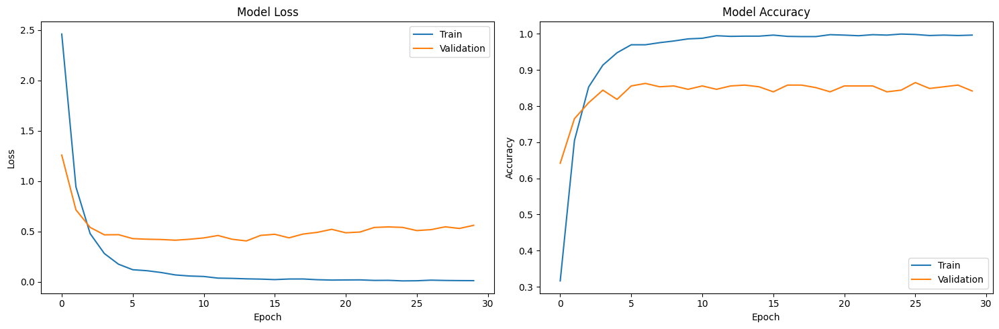

Test Loss: 0.4626
Test Accuracy: 0.8755
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step  
17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Raw data shape: (2150, 2000)
Layer 1 output shape: (2150, 256)
Layer 2 output shape: (2150, 64)


In [ ]:
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.models import Model

# Split data into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
 
# Get number of classes
nb_classes = Y.shape[1]
 
# Define dropout rate
dropout = 0.3
 
# Build neural network with 2 hidden layers
inputs = Input(shape=(X_train.shape[1],))
x = Dense(256, activation='relu')(inputs)
x = Dropout(0.3)(x)
x2 = Dense(64, activation='relu')(x)
x2 = Dropout(0.3)(x2)
outputs = Dense(nb_classes, activation='softmax')(x2)

model = Model(inputs=inputs, outputs=outputs)
 

model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)


# Print model summary
model.summary()
 
# Train the neural network
history = model.fit(X_train, Y_train,
                    batch_size=64,
                    epochs=30,
                    verbose=1,
                    validation_split=0.2)
 
# Plot training history
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
 
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.tight_layout()
plt.show()
 
# Evaluate on test set
loss, accuracy = model.evaluate(X_test, Y_test, verbose=0)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
 

# model that returns activations from selected layers
activation_model = Model(inputs=model.input,
                         outputs=[model.layers[1].output, model.layers[3].output])

# using the model to obtain activations
layer1_output, layer2_output = activation_model.predict(X_train)
test_layer1_output, test_layer2_output = activation_model.predict(X_test)
 

print(f"Raw data shape: {X_train.shape}")
print(f"Layer 1 output shape: {layer1_output.shape}")
print(f"Layer 2 output shape: {layer2_output.shape}")

# Exercise 1: Visualizing Human Brain DLPFC Spatial Data

In this exercise, you will explore the spatial organization of the human dorsolateral prefrontal cortex (DLPFC) using dimensionality reduction techniques applied to both raw data and neural network hidden layer activations.


## Task Description

1. **Project the DLPFC spatial transcriptomics data into a 2-dimensional space** using different dimensionality reduction techniques:
   - t-SNE  
   - UMAP  
   - TriMAP  
   - PaCMAP  

2. **Use the neural network’s hidden layer activations** to create alternative 2-dimensional projections with the same techniques.

3. **Visualize both the standard embeddings and the spatial context** of these embeddings.

4. **Use the 2-dimensional projections for layer classification**:
   - Implement k-nearest neighbors to classify the embedded test data  
   - Compare accuracy across different embedding techniques  
   - Try with several values of `n_neighbors`, e.g., [3, 5, 10]  

5. **Analyze spatial domains and cell-cell interactions**:
   - Identify regions with transitional gene expression patterns  
   - Detect boundary zones between cortical layers  
   - Visualize the relationship between spatial proximity and expression similarity  



## Code Template

Here’s a template to help you get started:


c:\Users\jacek\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


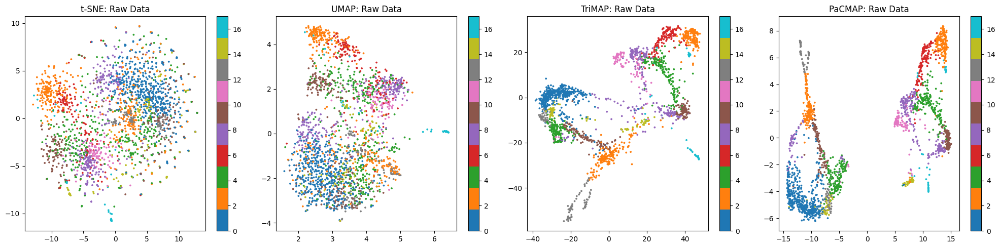

In [14]:
# Apply t-SNE to raw data
tsne = TSNE(n_components=2, random_state=42)
X_train_tsne = tsne.fit_transform(X_train)
 
# Apply UMAP to raw data
umap_model = umap.UMAP(n_components=2, random_state=42)
X_train_umap = umap_model.fit_transform(X_train)
X_test_umap = umap_model.transform(X_test)
 
# Apply TriMAP to raw data
trimap_model = trimap.TRIMAP(n_dims=2, n_inliers=10, n_outliers=5)
X_train_trimap = trimap_model.fit_transform(X_train)
 
# Apply PaCMAP to raw data
pacmap_model = pacmap.PaCMAP(n_components=2, n_neighbors=10, random_state=42)
X_train_pacmap = pacmap_model.fit_transform(X_train)
 
# Visualize the embeddings
plt.figure(figsize=(20, 5))
for i, (embedding, name) in enumerate(zip(
    [X_train_tsne, X_train_umap, X_train_trimap, X_train_pacmap],
    ['t-SNE', 'UMAP', 'TriMAP', 'PaCMAP']
)):
    plt.subplot(1, 4, i+1)
    plt.scatter(embedding[:, 0], embedding[:, 1], c=np.argmax(Y_train, axis=1),
                cmap='tab10', s=3)
    plt.title(f'{name}: Raw Data')
    plt.colorbar()
plt.tight_layout()
plt.show()

## Spatial Visualization

An important part of this exercise is to visualize how the embeddings relate to the actual spatial organization of the tissue:


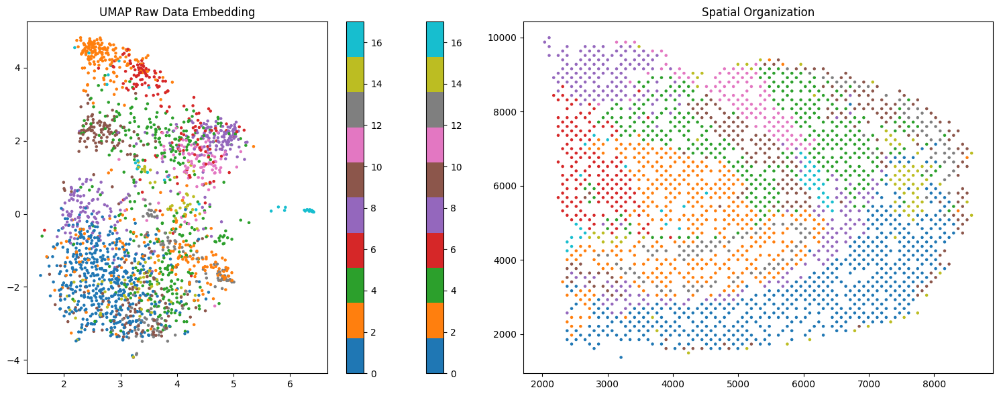

In [16]:
all_indices = np.arange(X.shape[0])
train_indices, test_indices = train_test_split(all_indices, test_size=0.2, random_state=42)
# Visualize embeddings in spatial context
def plot_spatial_embedding(embedding, title, labels, spatial_coords):
    plt.figure(figsize=(15, 6))
 
    # Display the embedding
    plt.subplot(1, 2, 1)
    scatter = plt.scatter(embedding[:, 0], embedding[:, 1],
                          c=labels, cmap='tab10', s=5)
    plt.title(f'{title} Embedding')
    plt.colorbar(scatter)
 
    # Display the same points in their spatial locations
    plt.subplot(1, 2, 2)
    plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1],
                c=labels, cmap='tab10', s=5)
    plt.title(f'Spatial Organization')
    plt.colorbar(scatter)
    plt.tight_layout()
    plt.show()
 
# Get spatial coordinates for your spots
spatial_coords = adata.obsm['spatial'][train_indices]  # Assuming you've tracked indices
y_labels = np.argmax(Y_train, axis=1)
 
# Plot embeddings in spatial context
plot_spatial_embedding(X_train_umap, 'UMAP Raw Data', y_labels, spatial_coords)

## KNN Classification

In [17]:
# Define a function to evaluate KNN on different embeddings
def evaluate_knn(X_train_embedded, X_test_embedded, y_train, y_test, n_neighbors_list):
    results = []
    for n_neighbors in n_neighbors_list:
        knn = KNeighborsClassifier(n_neighbors=n_neighbors)
        knn.fit(X_train_embedded, y_train)
        y_pred = knn.predict(X_test_embedded)
        accuracy = accuracy_score(y_test, y_pred)
        results.append((n_neighbors, accuracy))
        print(f"n_neighbors={n_neighbors}, Accuracy: {accuracy:.4f}")
    return results
 
# Convert one-hot encoded labels to class indices
y_train = np.argmax(Y_train, axis=1)
y_test = np.argmax(Y_test, axis=1)
 
# Test KNN with different numbers of neighbors
n_neighbors_list = [3, 5, 10]
 
print("Raw Data UMAP Embeddings:")
raw_results = evaluate_knn(X_train_umap, X_test_umap, y_train, y_test, n_neighbors_list)

Raw Data UMAP Embeddings:
n_neighbors=3, Accuracy: 0.4870
n_neighbors=5, Accuracy: 0.5130
n_neighbors=10, Accuracy: 0.5688


1. Identify regions with transitional gene expression patterns   
The Spatial Organization plot shows smooth color changes across the tissue, which suggests there are areas where gene expression gradually changes.  
3. Detect boundary zones between cortical layers   
Sharp transitions between different colors in the Spatial Organization plot suggest the presence of boundary zones between cortical layers.  

3. Visualize the relationship between spatial proximity and expression similarity

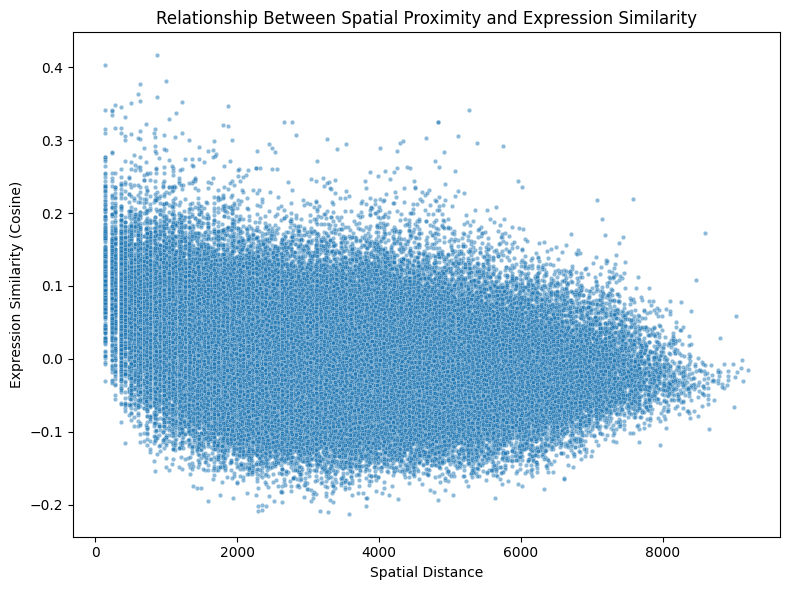

In [ ]:
from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
import seaborn as sns


np.random.seed(42)
indices = np.random.choice(X_train.shape[0], size=500, replace=False)
sample_spatial = spatial_coords[indices]
sample_expression = X_train[indices]


spatial_dists = euclidean_distances(sample_spatial)


expression_similarity = cosine_similarity(sample_expression)


spatial_flat = spatial_dists[np.triu_indices_from(spatial_dists, k=1)]
expression_flat = expression_similarity[np.triu_indices_from(expression_similarity, k=1)]


plt.figure(figsize=(8, 6))
sns.scatterplot(x=spatial_flat, y=expression_flat, s=10, alpha=0.5)
plt.xlabel("Spatial Distance")
plt.ylabel("Expression Similarity (Cosine)")
plt.title("Relationship Between Spatial Proximity and Expression Similarity")
plt.tight_layout()
plt.show()


## Expected Outcomes

1. You should observe that the visualization of hidden layer activations shows better clustering of cortical layers compared to raw data visualization.

2. The second hidden layer activations should generally show clearer boundaries between brain regions than the first hidden layer.

3. Classification accuracy should improve when using hidden layer activations compared to raw data.

4. By overlaying the embeddings on spatial coordinates, you should see coherent spatial patterns in the tissue that correspond to known anatomical structures.

5. The boundary regions between different cortical layers should be visible as transitional zones in both the embeddings and spatial visualizations.


# Exercise 2: Spatial Analysis of Breast Cancer Microenvironment

In this exercise, you will analyze spatial transcriptomics data from breast cancer tissue to identify tumor microenvironment components, visualize tumor heterogeneity, and detect interaction patterns between tumor and immune cells.

## Task Description

1. **Load and preprocess the breast cancer spatial transcriptomics dataset:**
2. **Apply dimensionality reduction to visualize tumor heterogeneity:**
   - Use t-SNE, UMAP, TriMAP, and PaCMAP on the raw expression data
   - Train a neural network to extract hidden layer representations
   - Apply the same dimensionality reduction techniques to hidden layer activations

3. **Identify tumor and stromal regions:**
   - Use marker genes to annotate tumor cells, immune cells, and stromal cells
   - Visualize these annotations in both embedding space and spatial coordinates

4. **Analyze spatial interactions:**
   - Quantify cell-type interactions based on spatial proximity
   - Identify tumor-immune interaction hotspots
   - Detect boundary regions between tumor and stroma

5. **Integrate hidden layer representations with spatial information:**
   - Analyze how neural network representations capture tumor heterogeneity
   - Compare different visualization methods for identifying tumor subclones
   - Investigate how well the representations preserve neighborhood relationships


### Code Template

try downloading from url
https://ndownloader.figshare.com/files/26098391
... this may take a while but only happens once


100%|██████████| 242M/242M [00:30<00:00, 8.22MB/s] 


Dataset shape: (2800, 16562)
Available annotations: ['in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_MT', 'log1p_total_counts_MT', 'pct_counts_MT', 'n_counts', 'leiden', 'cluster']
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


c:\Users\jacek\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_scale.py:317: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\3987645318.py:17: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, img_key="hires", size=1.5)


<Figure size 1200x1000 with 0 Axes>

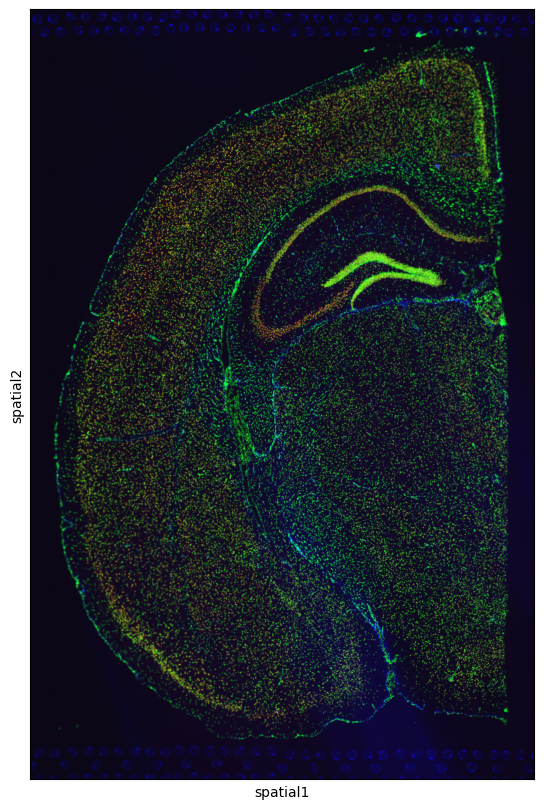

In [19]:
# Load breast cancer dataset
adata_bc = sq.datasets.visium_fluo_adata()
 
# Basic data exploration
print(f"Dataset shape: {adata_bc.shape}")
print(f"Available annotations: {list(adata_bc.obs.columns)}")
 
# Preprocess data
sc.pp.normalize_total(adata_bc, target_sum=1e4)
sc.pp.log1p(adata_bc)
sc.pp.highly_variable_genes(adata_bc, n_top_genes=2000)
adata_bc_hvg = adata_bc[:, adata_bc.var.highly_variable]
sc.pp.scale(adata_bc_hvg)
 
# View tissue structure
plt.figure(figsize=(12, 10))
sc.pl.spatial(adata_bc, img_key="hires", size=1.5)

### Identifying Marker Genes and Cell Types

computing score 'tumor_score'
    finished: added
    'tumor_score', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)
computing score 'immune_score'
    finished: added
    'immune_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'stromal_score'
    finished: added
    'stromal_score', score of gene set (adata.obs).
    200 total control genes are used. (0:00:00)


C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color=marker, size=1.5, show=False)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color=marker, size=1.5, show=False)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color=marker, size=1.5, show=False)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color=marker, size=1.5, show=False)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:16: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color=marker, size=1.5, show=False)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:16: Fut

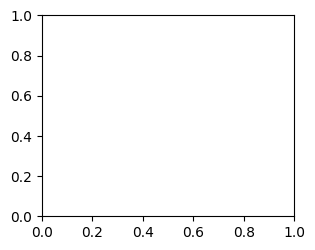

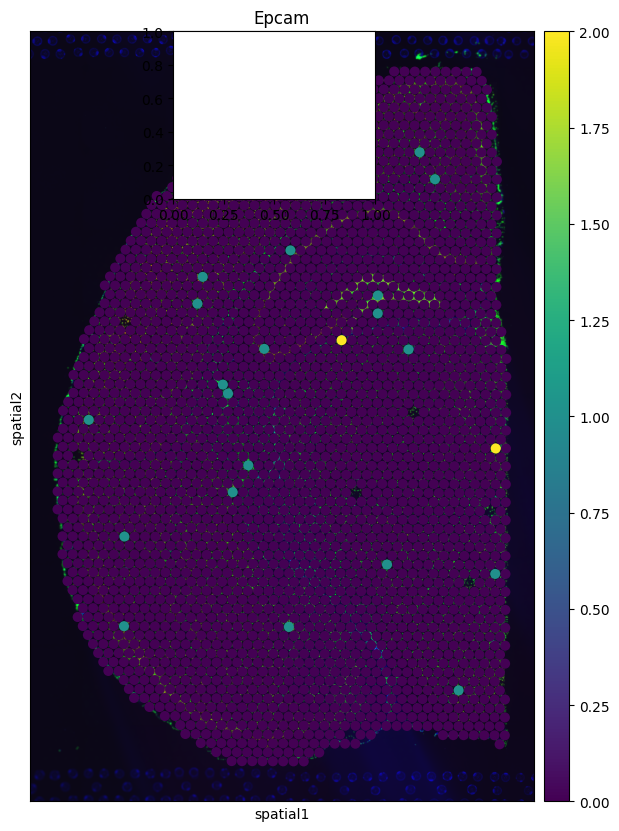

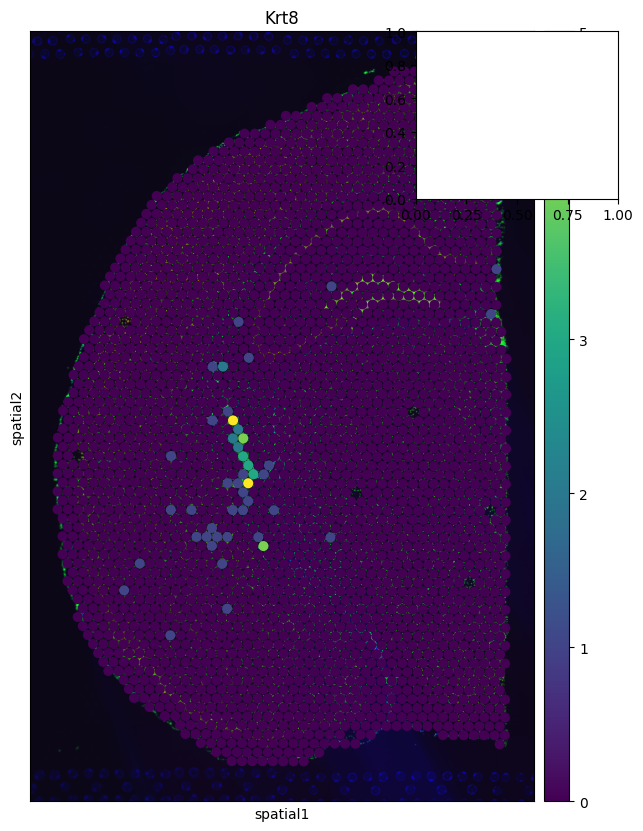

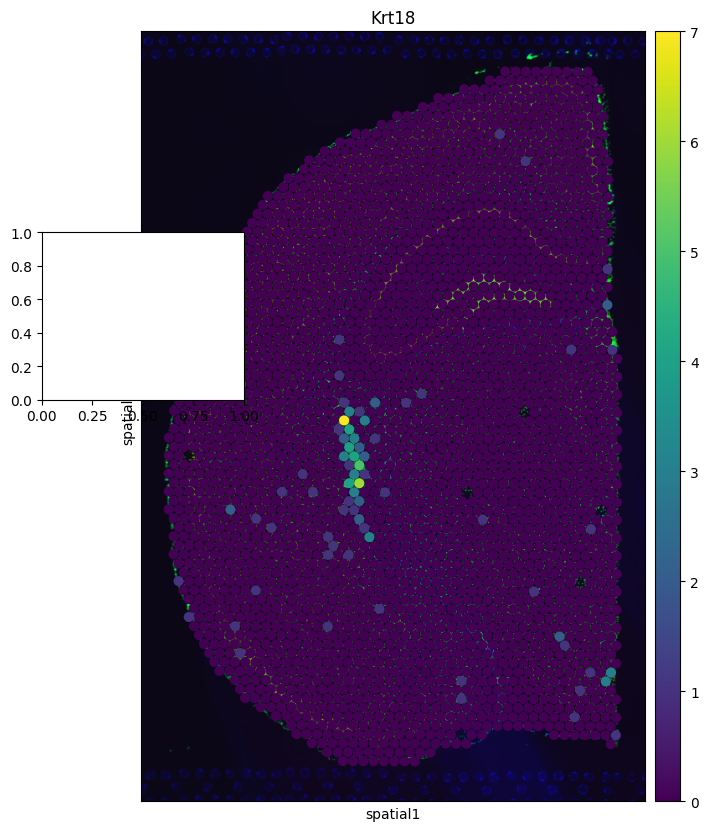

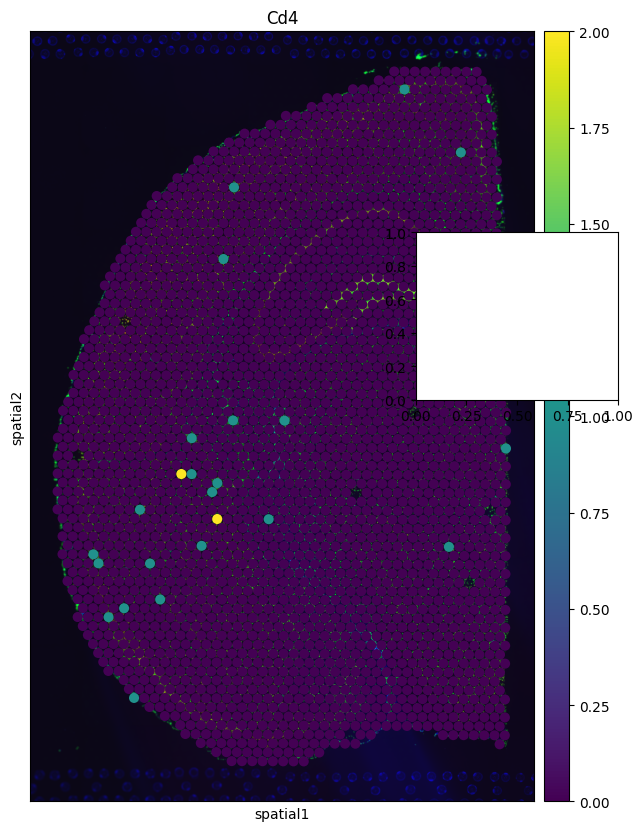

...

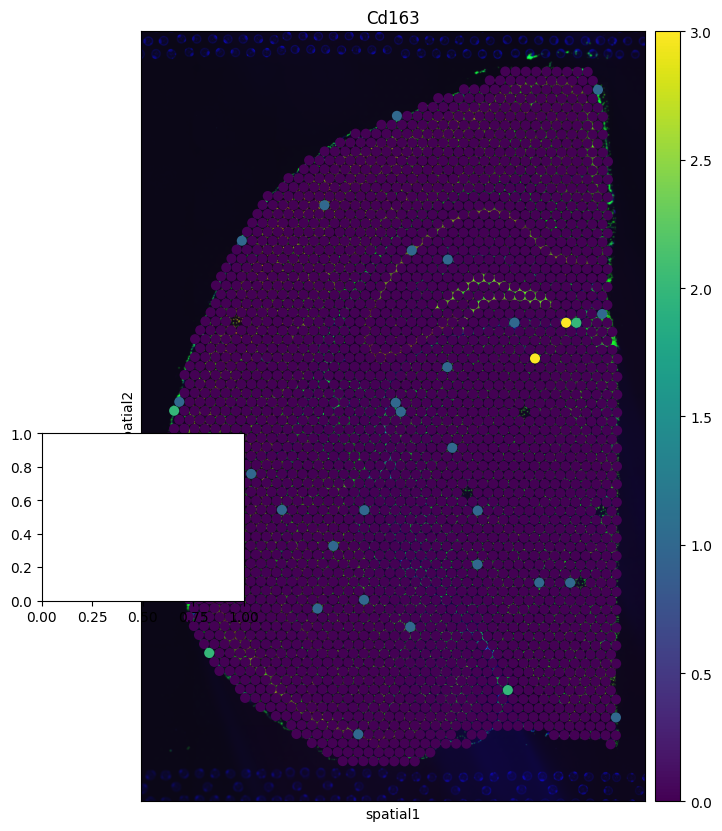

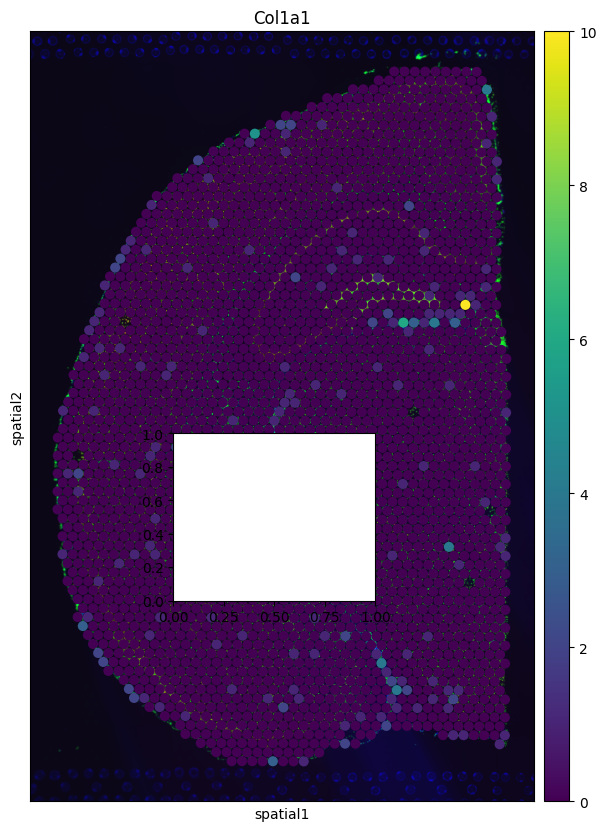

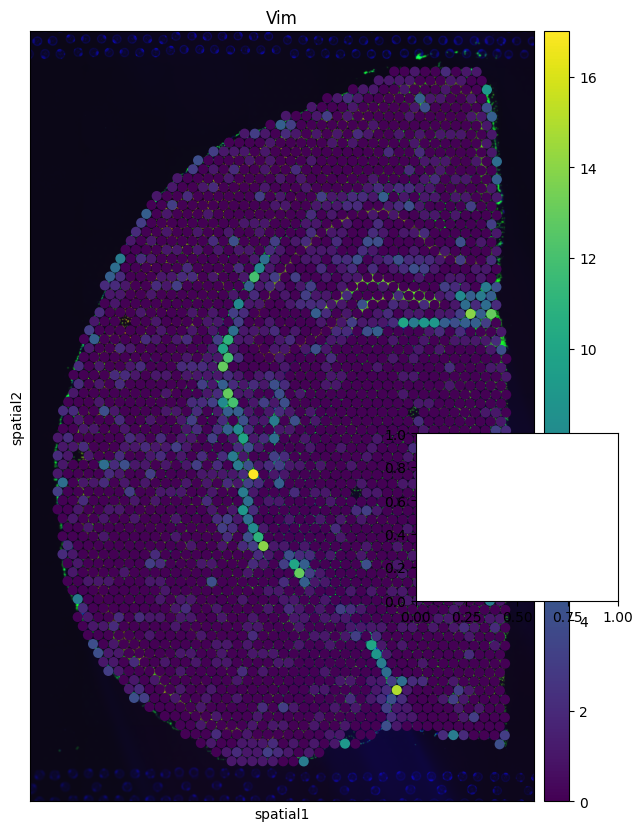

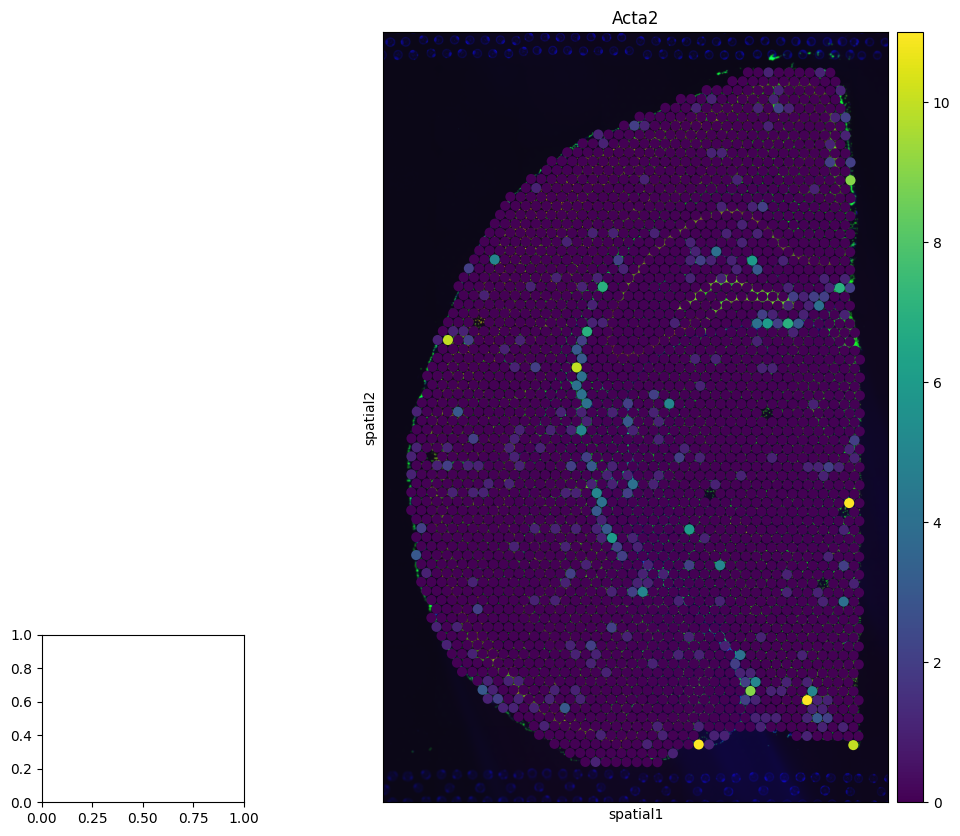

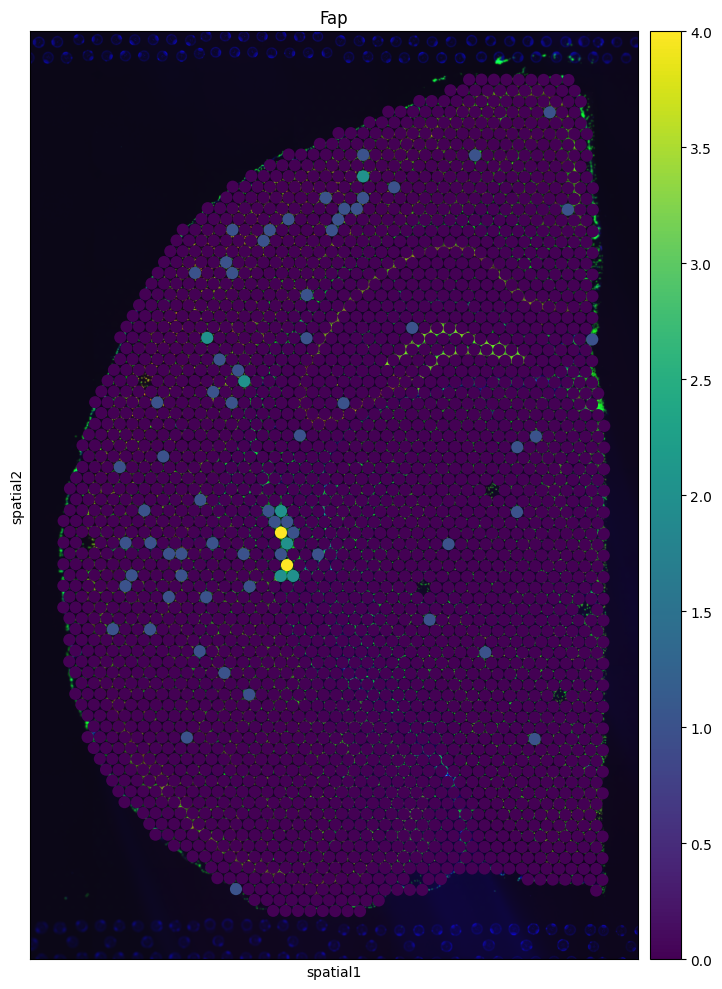

C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:24: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color='tumor_score', size=1.5, show=False)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:27: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color='immune_score', size=1.5, show=False)
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\862683778.py:30: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color='stromal_score', size=1.5, show=False)


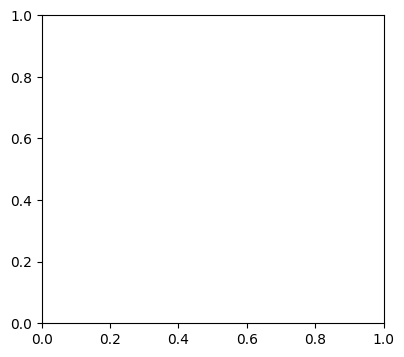

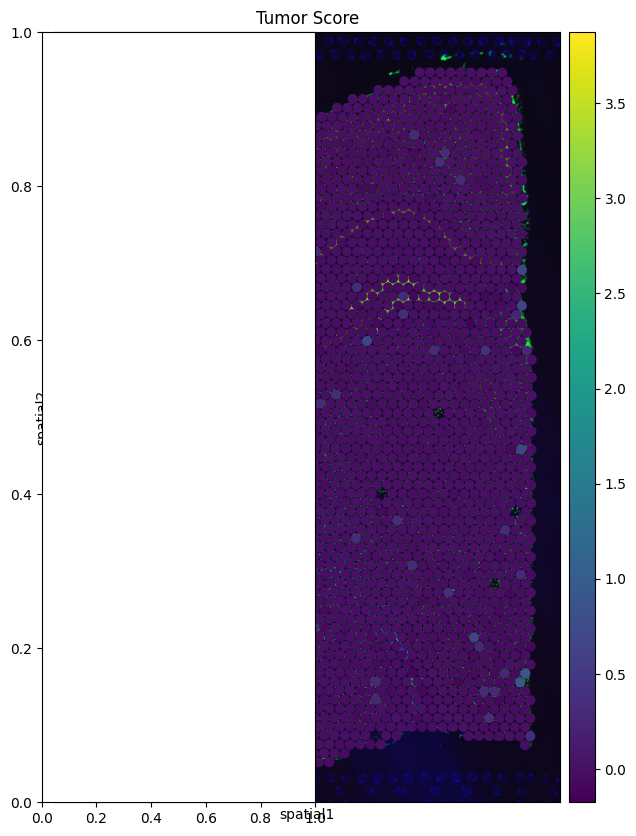

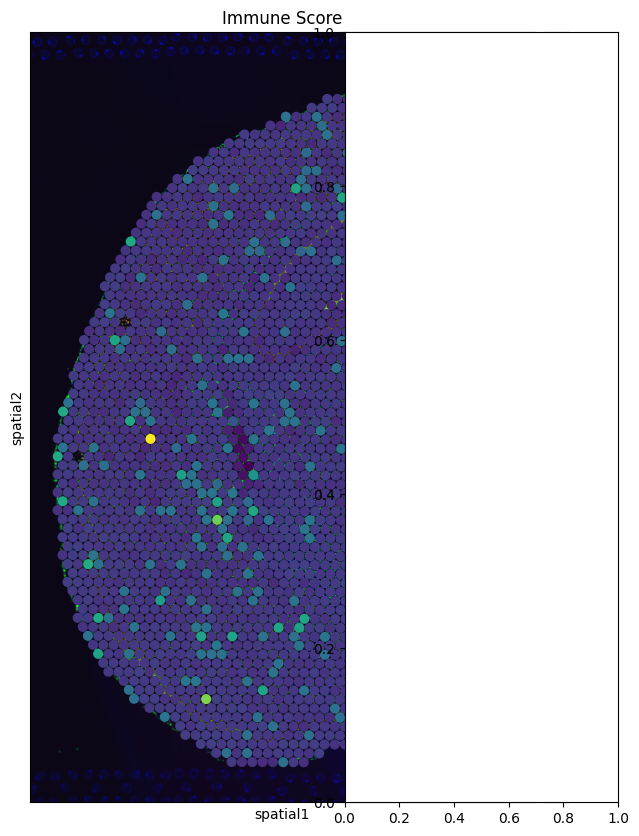

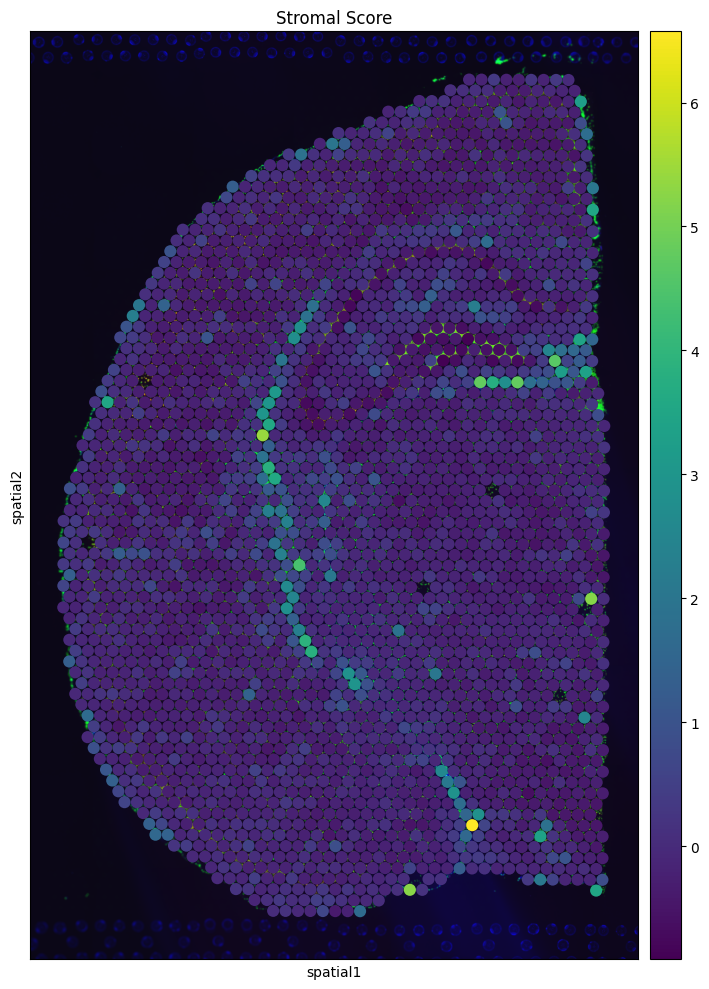

In [25]:
# Define marker genes for different cell types
tumor_markers = ['Epcam', 'Krt19', 'Krt8', 'Krt18']
immune_markers = ['Cd3d', 'Cd4', 'Cd8a', 'Cd68', 'Cd163']
stromal_markers = ['Col1a1', 'Vim', 'Acta2', 'Fap']
 
# Calculate scores for each cell type
sc.tl.score_genes(adata_bc, tumor_markers, score_name='tumor_score')
sc.tl.score_genes(adata_bc, immune_markers, score_name='immune_score')
sc.tl.score_genes(adata_bc, stromal_markers, score_name='stromal_score')
 
# Visualize marker gene expression and scores
plt.figure(figsize=(15, 12))
for i, marker in enumerate(tumor_markers + immune_markers + stromal_markers):
    if marker in adata_bc.var_names:
        plt.subplot(4, 4, i+1)
        sc.pl.spatial(adata_bc, color=marker, size=1.5, show=False)
        plt.title(marker)
plt.tight_layout()
plt.show()
 
# Visualize cell type scores
plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
sc.pl.spatial(adata_bc, color='tumor_score', size=1.5, show=False)
plt.title('Tumor Score')
plt.subplot(1, 3, 2)
sc.pl.spatial(adata_bc, color='immune_score', size=1.5, show=False)
plt.title('Immune Score')
plt.subplot(1, 3, 3)
sc.pl.spatial(adata_bc, color='stromal_score', size=1.5, show=False)
plt.title('Stromal Score')
plt.tight_layout()
plt.show()

Training Neural Network and Extracting Features

In [21]:
# Prepare data for neural network
X_bc = adata_bc_hvg.X.copy()
 
# For simplicity, we'll use unsupervised approach with autoencoder
# Define a simple autoencoder
input_dim = X_bc.shape[1]
encoding_dim = 64
 
# Encoder
input_layer = tf.keras.layers.Input(shape=(input_dim,))
encoder = tf.keras.layers.Dense(256, activation='relu')(input_layer)
encoder = tf.keras.layers.Dropout(0.2)(encoder)
encoder = tf.keras.layers.Dense(encoding_dim, activation='relu')(encoder)
 
# Decoder
decoder = tf.keras.layers.Dense(256, activation='relu')(encoder)
decoder = tf.keras.layers.Dropout(0.2)(decoder)
output_layer = tf.keras.layers.Dense(input_dim, activation='sigmoid')(decoder)
 
# Autoencoder model
autoencoder = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)
autoencoder.compile(optimizer='adam', loss='mse')
 
# Train autoencoder
autoencoder.fit(X_bc, X_bc, epochs=20, batch_size=64, shuffle=True, validation_split=0.2)
 
# Create a model to extract the encoded features
encoder_model = tf.keras.models.Model(inputs=input_layer, outputs=encoder)
encoded_features = encoder_model.predict(X_bc)
 
# Get the first hidden layer output as well
intermediate_layer_model = tf.keras.models.Model(
    inputs=input_layer,
    outputs=autoencoder.layers[1].output
)
intermediate_output = intermediate_layer_model.predict(X_bc)

Epoch 1/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 1.1221 - val_loss: 0.9745
Epoch 2/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9859 - val_loss: 0.9647
Epoch 3/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9737 - val_loss: 0.9561
Epoch 4/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9638 - val_loss: 0.9523
Epoch 5/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9594 - val_loss: 0.9497
Epoch 6/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9561 - val_loss: 0.9455
Epoch 7/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9510 - val_loss: 0.9416
Epoch 8/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9461 - val_loss: 0.9388
Epoch 9/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9417 - val_loss: 0.9366
Epoch 10/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9377 - val_loss: 0.9358
Epoch 11/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9346 - val_loss: 0.9352
Epoch 12/20
35/35 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.9317 - val_lo

### Spatial Interaction Analysis

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\851229932.py:9: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata_bc, color='leiden', size=1.5, legend_loc='on data')


C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\851229932.py:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  current_cluster = adata.obs[cluster_key][i]
C:\Users\jacek\AppData\Local\Temp\ipykernel_20904\851229932.py:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  neighbor_cluster = adata.obs[cluster_key][neighbor]


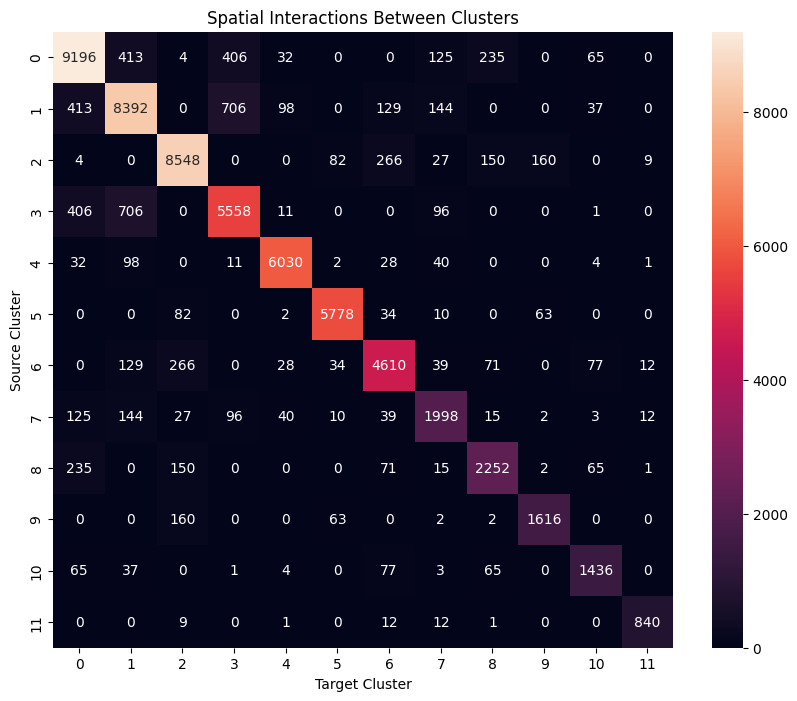

In [42]:
# Compute neighborhood graph to analyze cell-cell interactions
sc.pp.neighbors(adata_bc, use_rep='X_pca')
 
# Find clusters/regions
sc.tl.leiden(adata_bc, resolution=0.8)
 
# Visualize clusters in spatial context

sc.pl.spatial(adata_bc, color='leiden', size=1.5, legend_loc='on data')
 
# Compute interaction scores between regions
def compute_interactions(adata, cluster_key='leiden'):
    # Count neighbors of different clusters for each spot
    clusters = adata.obs[cluster_key].cat.categories
    n_clusters = len(clusters)
 
    # Get the indices of nearest neighbors from the connectivities matrix
    connectivity = adata.obsp['connectivities']
 
    # Initialize interaction matrix
    interaction_matrix = np.zeros((n_clusters, n_clusters))
 
    # For each spot, count interactions with spots of different clusters
    for i in range(adata.n_obs):
        # Get the cluster of the current spot
        current_cluster = adata.obs[cluster_key][i]
        current_idx = np.where(clusters == current_cluster)[0][0]
 
        # Get indices of neighbors
        neighbors = connectivity[i].nonzero()[1]
 
        # Count neighbors by cluster
        for neighbor in neighbors:
            neighbor_cluster = adata.obs[cluster_key][neighbor]
            neighbor_idx = np.where(clusters == neighbor_cluster)[0][0]
            interaction_matrix[current_idx, neighbor_idx] += 1
 
    return interaction_matrix, clusters
 
# Compute and visualize interactions
interaction_matrix, cluster_names = compute_interactions(adata_bc)
 
# Visualize interaction matrix
plt.figure(figsize=(10, 8))
sns.heatmap(interaction_matrix, annot=True, fmt='.0f',
            xticklabels=cluster_names, yticklabels=cluster_names)
plt.title('Spatial Interactions Between Clusters')
plt.xlabel('Target Cluster')
plt.ylabel('Source Cluster')
plt.show()

Dimensionality Reduction Reveals Tumor Heterogeneity. We applied an autoencoder-based dimensionality reduction  
to compress the high-dimensional gene expression profiles into lower-dimensional representations. The encoded   
features captured latent structure in the data, likely reflecting biological variation across tumor regions.  

## Expected Outcomes

1. Visualizations should reveal distinct regions of tumor, immune infiltration, and stromal areas in the breast cancer tissue.
2. Neural network hidden layers should provide better separation between tumor subclones than raw gene expression data.
3. Spatial analysis should identify regions of tumor-immune cell interactions, which may be biologically significant for understanding cancer progression and treatment response.
4. Different dimensionality reduction techniques will have varying effectiveness at highlighting tumor heterogeneity and microenvironment structures.
5. The integration of expression data with spatial information should reveal patterns not evident when analyzing expression or spatial data alone.
